# Проектная работа: Рынок заведений общественного питания Москвы  

# Описание проекта  

**Задачи проекта**  

Исследование рынка общественного питания Москвы на основе открытых данных, поиск особенностей, подготовка презентации, которая поможет в выборе подходящего инвесторам места.

**Ход исследования**  
1. Загрузка и обзор данных
2. Предобработка данных
3. Анализ данных, в т.ч.:
 * Категории заведений в датасете;
 * Количество посадочных мест по категориям;
 * Соотношение сетевых/несетевых заведений;
 * Топ-15 популярных сетей в Москве;
 * Распределение заведений по административным районам;
 * Средние рейтинги заведений;
 * Рейтинги заведений на карте Москвы;
 * Топ-15 улиц по количеству заведений;
 * Улицы только с 1 заведением общепита;
 * Медианный чек заведений по районам;
4. Детализация исследования: открытие кофейни.
5. Подготовка презентации и выводы.


## Загрузка и обзор данных

In [1]:
# библиотеки
import pandas as pd
import numpy as np
#from datetime import datetime, timedelta
import datetime as dt
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats as st
import math as mth
import plotly.express as px
from plotly import graph_objects as go

import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

In [2]:
pd.set_option('display.float_format', '{:.2f}'.format)
colors = sns.color_palette('pastel')

In [3]:
# загружаем данные 
path = 'https://code.s3.yandex.net/datasets/'
data = pd.read_csv(path + 'moscow_places.csv') 

In [4]:
# функция для просмотра данных о дф
def description(x):
    display('Первые строки таблицы:')
    display(x.head())
    print('*'*50)
    display('Общая информации о данных:')
    display(x.info())
    print('*'*50)
    display('Распределение численных показателей:')
    display(x.describe())
    print('*'*50)
    display('Проверка на дубликаты:')
    display(x.duplicated().sum())

In [5]:
description(data)

'Первые строки таблицы:'

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


**************************************************


'Общая информации о данных:'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

**************************************************


'Распределение численных показателей:'

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


**************************************************


'Проверка на дубликаты:'

0

Имеем 8406 строк, явных дубликатов нет, есть много пропусков. Названия столбцов корректные. Посмотрим, какие значения есть в разных столбцах.

In [6]:
# названия заведения
data['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Bros Burritos         1
У Акопа               1
Солнце в тарелке      1
Phở bò nam định       1
FoodMoscowCoffee      1
Name: name, Length: 5614, dtype: int64

In [7]:
# количество уникальных адресов:
print('Количество уникальных адресов:', data['address'].nunique())

Количество уникальных адресов: 5753


Количество административных районов: 9


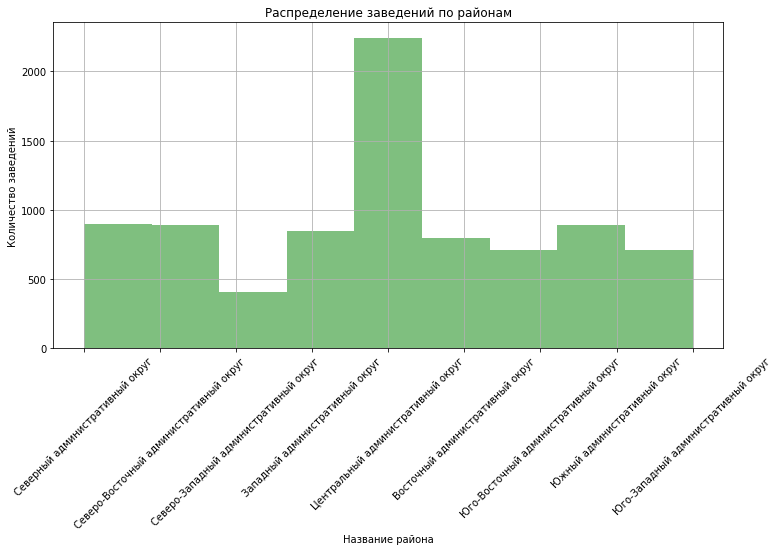

In [8]:
# data['district'].value_counts()
print('Количество административных районов:', data['district'].nunique())
data['district'].hist(figsize=(12,6), alpha=0.5, color='green', bins=9)
plt.title('Распределение заведений по районам')
plt.xticks(rotation=45)
plt.xlabel('Название района')
plt.ylabel('Количество заведений');

**Вывод:** Дано 8406 строк в датасете с данными о 5614 заведениях, которые расположены в 9 административных районах Москвы. Больше всего заведений в ЦАО. Типы данных, названия столбцов корректные, явных дубликатов нет. Есть большое количество пропусков в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.  

## Предобработка данных  

* **Обработка дубликатов**  
Приведем значения столбцов с названиями заведений, адресами, средней стоимостью заказа, режимом работы заведений к единому нижнему регистру, чтобы проверить наличие неявных дубликатов.

In [9]:
data.sample()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6576,Ricers,ресторан,"Москва, улица Академика Анохина, 58",Западный административный округ,"ежедневно, 10:00–23:00",55.65,37.47,4.40,NaN,NaN,NaN,NaN,1,280.00


In [10]:
# приводим столбцы к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()
data['hours'] = data['hours'].str.lower()

In [11]:
data.duplicated(subset=['name', 'address']).sum()
print('Количество неявных дубликатов:', data.duplicated(subset=['name', 'address']).sum())

Количество неявных дубликатов: 4


In [12]:
# удаляем
data = data.drop_duplicates(subset=['name', 'address'])

In [13]:
#data.shape

* **Обработка пропусков**

In [14]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Видим большое количество пропусков в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.  
* В столбце hours хранятся данные о режиме работы заведения. Т.к. нет возможноси заполнить эти данные конкретными значениями, заполним пропуски значением unknown.  
* В столбце price хранятся данные о категории цен в заведении. Аналогично заполним пропуски значением unknown.
* Пропуски в столбцах avg_bill, middle_avg_bill, middle_coffee_cup, seats оставим как есть, чтобы не искажать результаты исследования. Причиной пропусков может быть как техническая ошибка, так и человеческий фактор (не внесена соответствующая информация при заполнении карточек заведений).

In [15]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [16]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [17]:
data['hours'] = data['hours'].fillna('unknown')
data['price'] = data['price'].fillna('unknown')
# data['avg_bill'] = data['avg_bill'].fillna('unknown')

# data.isna().sum()

In [18]:
data['avg_bill'].value_counts()

средний счёт:1000–1500 ₽         241
средний счёт:1500–2000 ₽         120
средний счёт:300–500 ₽            90
средний счёт:500–1000 ₽           78
средний счёт:1500–2500 ₽          68
                                ... 
средний счёт:280–290 ₽             1
средний счёт:313 ₽                 1
средний счёт:2600 ₽                1
цена бокала пива:290–390 ₽         1
цена чашки капучино:285–289 ₽      1
Name: avg_bill, Length: 897, dtype: int64

In [19]:
#data.shape

In [20]:
# посадочные места
data['seats'].describe()

count   4792.00
mean     108.36
std      122.84
min        0.00
25%       40.00
50%       75.00
75%      140.00
max     1288.00
Name: seats, dtype: float64

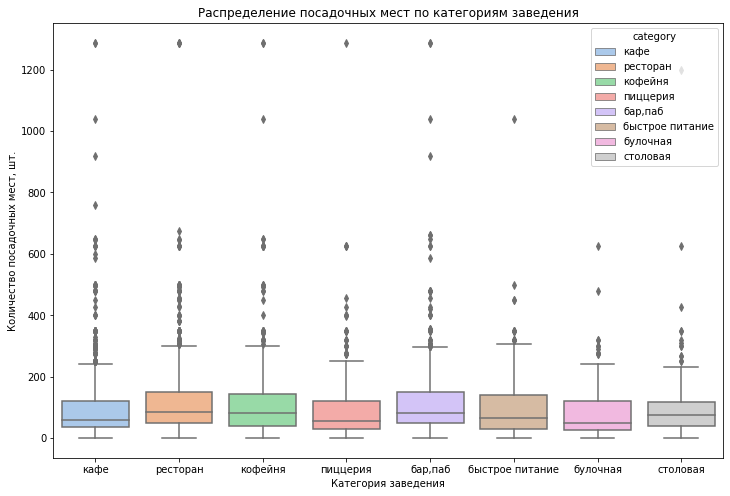

In [21]:
plt.figure(figsize=(12,8))
sns.set_palette('pastel')
sns.boxplot(y='seats', data=data, x='category', hue='category', dodge=False)
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест, шт.')
plt.title('Распределение посадочных мест по категориям заведения');
plt.show();

In [22]:
len(data[data['seats'] > 500])

56

In [23]:
#data.shape

На графике заметны выбросы. Возможно, они связаны с ошибкой при заполнении данных. В целом заведений более чем с 500 посадочными местами немного, всего 56. Оставим, как есть. Заполнять пропуски расчетными данными будет некорректно, т.к. в одном районе либо в одной категории заведений могут абсолютно разные по площади заведений. 

* **Добавления столбцов с названиями улиц и данными о круглосуточном режиме**

In [24]:
# разбиваем строку с адресом по символу ',' и берем нужный элемент списка
data['street'] = data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,unknown,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,unknown,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица


Добавим столбец is_24/7 с информацией о круглосуточном ежедневном режиме работы. Если заведение работает круглосуточно без выходных, то значение в столбце будет True, иначе - False.

In [25]:
#data['hours'].unique()

In [26]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,unknown,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,unknown,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


In [27]:
data['is_24/7'].value_counts()

False    7672
True      730
Name: is_24/7, dtype: int64

**Вывод:** Проведена предобработка данных, в т.ч. после перевода значений категориальных столбцов к нижнему регистру удалены неявные дубликаты, заполнены пропуски в столбцах с категорией цен в заведении и режимом работы. Добавлены дополнительные столбцы с признаком круглосуточного режима работы, улицей расположения заведения.

## Анализ данных

### Категории заведений

Посмотрим, какие категории заведений представлены в данных и количество объектов общественного питания по этим категориям.

In [28]:
#data['category'].value_counts()

In [29]:
# сводная таблица с количество заведений каждой категории
places_cat = (data
                .groupby('category', as_index=False)
                .agg({'name':'count'})
                .sort_values(by='name', ascending=False)
                .reset_index(drop=True))
places_cat.columns = ['category', 'count']
places_cat

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [30]:
# диаграмма
fig = px.bar(places_cat, 
             x='category', 
             y='count',  
             color='category',
             text = 'count',
             title = 'Распределение количества заведений по категориям',
             template='plotly_white'
             )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Количество заведений',
                  xaxis={'categoryorder':'total descending'}, 
                  width=800, # размеры графика
                  height=500)
fig.show();

**Вывод:** Всего представлено 8 категорий заведений: ресторан, кафе, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная. Самые популярные категории заведений - кафе (2376) и рестораны (2042). На третьем месте - кофейни (1413). Наименьшее количество заведений представлено в категории столовая (315) и булочная (256).

### Распределение посадочных мест в разных категориях заведений

Исключим из рассмотрения заведения с нулевым количеством посадочных мест и посмотрим, как распределено количество мест в заведении по разным категориям.

In [31]:
seats_cat = (
    data[data['seats'] != 0]
    .pivot_table(index='category', values='seats', aggfunc={'count', 'mean', 'median'})
    .sort_values(by='count', ascending=False)
    .reset_index()
)
seats_cat

,category,count,mean,median
0,ресторан,1249,123.84,90.00
1,кафе,1173,101.02,60.00
2,кофейня,727,114.87,80.00
3,"бар,паб",463,125.55,84.00
4,пиццерия,417,96.76,56.00
5,быстрое питание,331,104.27,75.00
6,столовая,159,102.89,80.00
7,булочная,137,96.56,52.00


Чтобы исключить влияние выбросов, построим диаграмму распределения количества мест в заведениях по медианным значениям.

In [32]:
# диаграмма
fig = px.bar(seats_cat, 
             x='category', 
             y='count',  
             color='category',
             text = 'count',
             title = 'Распределение общего количества мест в заведениях по категориям',
             template='plotly_white'
             )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Общее количество посадочных мест',
                  xaxis={'categoryorder':'total descending'},
                  width=800, # размеры графика
                  height=500)
fig.show();

In [33]:
fig = px.bar(seats_cat, 
             x='category', 
             y='median',  
             color='category',
             text = 'median',
             title = 'Распределение медианного количества мест в заведениях по категориям',
             template='plotly_white'
             )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Медианное количество посадочных мест',
                  xaxis={'categoryorder':'total descending'},
                  width=800, # размеры графика
                  height=500)
fig.show();

**Вывод:** С учетом популярности ресторанов и кафе вполне логично, что общее количество посадочных мест в этих категориях заведений существенно больше, чем в остальных категориях. Медианное количество мест в заведениях по категориям распределено достаточно ровно, рестораны- чуть более вместительные заведения, медианное значение количества мест - 90. Кафе, пиццерии и булочные - наименнее вместительные.

### Соотношение сетевых и несетевых заведений  

Рассмотрим соотношение сетевых и несетевых заведений.

In [34]:
chain_places = (data
                .pivot_table(index='chain', values='name', aggfunc='count')
                .rename(columns={'name':'count'})
                .reset_index()
               )
chain_places['percent'] = round(chain_places['count']*100/chain_places['count'].sum(), 2)
chain_places

,chain,count,percent
0,0,5199,61.88
1,1,3203,38.12


In [35]:
colors = ["mediumturquoise", "lightgreen"]

fig = go.Figure(data=[go.Pie(labels=["Несетевые", "Сетевые"],
                             values=chain_places['count'],
                              marker=dict(colors=colors)
                            )
                     ]
               )
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # заголовок 
                  width=800, # размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=colors, line=dict(color='#ffffff', width=2)))

fig.show() 

**Вывод:** Несетевых заведений ощутимо больше, чем сетевых, почти 62% против 38.

###	Категории сетевых заведений

In [36]:
# сводная таблица с количеством заведений каждого типа по категориям
chain_cat = (data
                .pivot_table(index='category', columns='chain', values='name', aggfunc='count')
                .rename(columns={0:'not_chain', 1:'chain'})
                .sort_values(by='chain', ascending=False)
                .reset_index()
               )
# общее количество заведений
chain_cat['total'] = chain_cat['not_chain'] + chain_cat['chain']
# столбец с долей сетевых
chain_cat['chain_part'] = (chain_cat['chain']/chain_cat['total']*100).round(2)

chain_cat

chain,category,not_chain,chain,total,chain_part
0,кафе,1597,779,2376,32.79
1,ресторан,1313,729,2042,35.70
2,кофейня,693,720,1413,50.96
3,пиццерия,303,330,633,52.13
4,быстрое питание,371,232,603,38.47
5,"бар,паб",596,168,764,21.99
6,булочная,99,157,256,61.33
7,столовая,227,88,315,27.94


In [37]:
# диаграмма
fig = px.bar(chain_cat,
             x='category',
             y='chain',
             color='category',
             title='Распределение сетевых заведений по категориям',
             template='plotly_white'
            )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Количество сетевых заведений',
                  xaxis={'categoryorder':'total descending'},
                  width=800, # размеры графика
                  height=500)
fig.show();

In [38]:
fig = px.bar(chain_cat,
             x='category', 
             y='chain_part',
             color='category',
             template='plotly_white'
            )
fig.update_layout(title='Распределение сетевых заведений в долях в рамках одной категории',
                  xaxis_title='Категории заведений',
                  yaxis_title='Доля сетевых заведений, %',
                  xaxis={'categoryorder':'total descending'},
                  width=800, # размеры графика
                  height=500
                 )
fig.show() 

**Вывод:** Кафе, рестораны и кофейни - наиболее популярные категории сетевых заведений (779, 729, 720 заведений соответственно). Сетевой формат наиболее характерен для булочных (61% заведений), пиццерий (52%) и кофейн (51%). В целом по результатам анализа видим, что кофейни - достаточно популярный вид заведений, половина из которых являются сетевыми.  

###	Топ-15 популярных сетей в Москве  

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве (под популярностью понимается количество заведений этой сети в регионе). 

In [39]:
top_15 = (data[data['chain'] == 1]
          .groupby('name')
          .agg({'rating':'median',
                    'category':pd.Series.mode,
                    'district':'count'})
)
top_15.columns = ['rating', 'category', 'count']
top_15 = top_15.sort_values('count', ascending=False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,120
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


In [40]:
fig = px.bar(top_15,
             x='count', 
             y='name',
             color='name',
             template='plotly_white'
            )
fig.update_layout(title='Топ-15 популярных сетей в г. Москва',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название',
                  xaxis={'categoryorder':'total descending'},
                  width=1000, height=500
                 )
fig.show() 

Cамым популярным сетевым заведением является Шоколадница, она лидирует с ощутимым отрывом. На втором и третьем месте пиццерии 'Домино'с пицца' и 'Додо пицца'.

In [41]:
print(f'Средний рейтинг топ-15 заведений:', top_15['rating'].mean()) 

Средний рейтинг топ-15 заведений: 4.21


In [42]:
(top_15
 .groupby('category')
 .agg({'count':'count'})
 .sort_values('count', ascending=False)
 .reset_index())

,category,count
0,кофейня,5
1,кафе,4
2,ресторан,3
3,пиццерия,2
4,булочная,1


**Вывод:** Самым популярным сетевым заведением оказалась кофейня Шоколадница. На втором и третьем местах - пиццерии 'Домино'с пицца' и 'Додо пицца'. В топ-15 сетевых заведений вошли 5 кофеен, 4 кафе, 3 ресторана 2 пиццерии и одна булочная. Средний рейтинг этих заведений - 4.2 по 5-балльной шкале.

### Распределение заведений и их категорий по административным районам Москвы  

Посмотрим, какие административные районы Москвы присутствуют в датасете и как распределены заведения и их категории по ним.

In [43]:

districts = (data
             .groupby(['district','category'])
             .agg({'name':'count'})
             .sort_values('name', ascending=False)
             .reset_index()
             .rename(columns={'name':'count'})
            )
districts.head()

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282


In [44]:
fig = px.bar(districts, y='district', x='count', color='category')
fig.update_layout(title='Распределение категорий заведений по районам',
                  xaxis_title='Количество заведений',
                  yaxis_title='Админстративный район',
                  xaxis={'categoryorder':'total descending'},
                  width=1000, height=500
                 )
fig.show() 

In [45]:
# количество заведений по районам
(districts.groupby('district')
 .agg({'count': 'sum'})
 .sort_values(by='count', ascending=False))

,count
district,
Центральный административный округ,2242
Северный административный округ,898
Южный административный округ,892
Северо-Восточный административный округ,890
Западный административный округ,850
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


In [46]:
# количество категорий, представленных в районах
(districts.groupby('district')
 .agg({'category': 'count'})
 .sort_values(by='category', ascending=False))

,category
district,
Восточный административный округ,8
Западный административный округ,8
Северный административный округ,8
Северо-Восточный административный округ,8
Северо-Западный административный округ,8
Центральный административный округ,8
Юго-Восточный административный округ,8
Юго-Западный административный округ,8
Южный административный округ,8


**Вывод:** Всего в датасете представлено 9 административных районов. Наибольшее количество заведений общепита представлено в ЦАО - 2242 объектов, что неудивительно, округ центральный, на его территории расположены 6 вокзалов, значительную часть территории занимают министерства, различные офисные здания. В ЦАО больше всего ресторанов - 670 объектов, кафе - 464 об., кофеен - 428 об.  
Самый малочисленный по количеству заведений - СЗАО. В каждом районе представлены все 8 категорий заведений. 


### Распределение средних рейтингов по категориям заведений  

Посмотрим, отличаются ли средние рейтинги в разных типах общепита.

In [47]:
rating_cat = (data
              .groupby('category')
              .agg({'rating':'mean'})
              .sort_values('rating', ascending=False)
              .reset_index()
              .rename(columns={'rating':'avg_rating'})
             )
rating_cat

,category,avg_rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [48]:
fig = px.bar(rating_cat, x='category', y='avg_rating', color='category')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Категория заведения',
                  yaxis_title='Средний рейтинг',
                  xaxis={'categoryorder':'total descending'},
                  width=1000, height=500
                 )
fig.show() 

**Вывод:**  Наиболее высокие усредненные рейтинги у баров/пабов, пиццерий и ресторанов. В целом средние рейтинги заведений не существенно отличаются и находятся в диапазоне от 4.05 до 4.39 по 5-балльной шкале.

### Средние рейтинги заведение на карте Москвы

Сгруппируем данные по районам и вычислим средний рейтинг заведений для каждого района.

In [49]:
ratings_df = (data
                    .groupby('district', as_index=False)['rating']
                    .agg('mean')
                    .sort_values(by='rating', ascending=False)
                    .reset_index(drop=True)
             )
ratings_df

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [50]:
# читаем файл и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except: 
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [51]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=ratings_df,
    columns=['district', 'rating'],
    key_on='feature.name', 
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
    hover_name='district'
).add_to(m1)
# выводим карту

m1


**Вывод:** На карте Москвы видно, что самые высокие рейтинги у объектов, расположенных в ЦАО (4.38), САО (4.24) и СЗАО (4.21). Наиболее низкие рейтинги у заведений в ЮВАО (4.10).

### Все заведения датасета на карте

In [52]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m2)

def create_clusters(row):
    Marker([row['lat'], 
            row['lng']], 
           popup=f"{row['name']} {row['rating']}", ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m2

**Вывод:** Ожидаемо, что основная масса заведений расположена в центре города.

### Топ-15 улиц по количеству заведений

In [53]:
top15_streets = (data
                 .groupby('street')
                 .agg({'name':'count'})
                 .rename(columns={'name':'count'})
                 .sort_values(by='count', ascending=False)
                 .reset_index()
                 .head(15)
                )

top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [54]:
fig = px.bar(top15_streets, x='street', y='count', color='street')
fig.update_layout(title='Топ-15 улиц по количеству заведений',
                  xaxis_title='Название улицы',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'},
                  width=1000, height=500
                 )
fig.show() 

Больше всего заведений на проспекте Мира (183 объекта), расположенном в ЦАО и СВАО, его длина составляет порядка 8.9 км. Рядом расположены крупные станции метро, большое количество памятников архитектуры.  
На втором месте - ул. Профсоюзная - 122 объекта, протяженностью 9.3 км., ЮЗАО. 

In [55]:
streets_cat = (data
               .groupby(['street', 'category'])
               .agg({'name':'count'})
               .rename(columns={'name':'count'})
               .sort_values(by='count', ascending=False)
               .reset_index()
              )

streets_cat.head()

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35


In [56]:
# улицы из топ15
streets_cat_top15 = streets_cat[streets_cat['street'].isin(top15_streets['street'])]
streets_cat_top15.head()

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35


In [57]:
fig = px.bar(streets_cat_top15, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'},
                  width=1000, height=500
                 )
fig.show()

**Вывод:** Больше всего заведений на улицах из списка топ-15 в категориях кафе, рестораны и кофейни. Меньше всего - булочных, столовых и пиццерий. Из общей картины выделяемтся МКАД, где доля кафе больше, чем в остальных районах.

### Улицы только с одним объектом общепита

In [58]:
# отберем те улицы, где есть только одно заведение общепита
one_place = (data
             .groupby('street')
             .agg({'name':'count'})
             .reset_index()
             .rename(columns={'name':'count'})
             .query('count == 1')
            )
print('Количество улиц только с одним заведением:', len(one_place))
display(one_place.head())

Количество улиц только с одним заведением: 457


,street,count
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1


In [59]:
one_place_data = data.query('street == @one_place["street"].tolist()')
print('\033[1m'+'Категории заведений:'+'\033[0m')
one_place_data['category'].value_counts()

Категории заведений:


кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [60]:
print('\033[1m'+'Районы, к которым относятся улицы с одним заведением:'+'\033[0m')
one_place_data['district'].value_counts()

Районы, к которым относятся улицы с одним заведением:


Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [61]:
print('\033[1m'+'Категория цен в заведении:'+'\033[0m')
one_place_data['price'].value_counts()

Категория цен в заведении:


unknown          275
средние          120
выше среднего     29
высокие           22
низкие            11
Name: price, dtype: int64

In [62]:
print('\033[1m'+'Средний рейтинг заведений на улицах с 1 заведением:'+'\033[0m', round(one_place_data['rating'].mean(), 2))

Средний рейтинг заведений на улицах с 1 заведением: 4.24


In [83]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)
# применяем функцию create_clusters() к каждой строке датафрейма
one_place_data.apply(create_clusters, axis=1)
m3

NameError: name 'folium' is not defined

**Вывод:** Наибольшее количество улиц только с одним заведением расположено в ЦАО, таких улиц там 145, что в разы больше аналогичного показателя для других районов. В осномном это кафе со средним уровнем цен, рейтингом в районе 4.24. 

### Медианный чек заведений по районам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. 

In [64]:
district_avg_bill = (data
                     .groupby('district')
                     .agg({'middle_avg_bill':'median'})
                     .rename(columns={'middle_avg_bill':'median_bill'})
                     .sort_values(by='median_bill', ascending=False)
                     .reset_index()
                    )
district_avg_bill

,district,median_bill
0,Западный административный округ,1000.00
1,Центральный административный округ,1000.00
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [65]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'median_bill'],
    key_on='feature.name', 
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Медианная цена заказа по районам',
    hover_name='district'
).add_to(m4)

# выводим карту
m4

**Вывод:** Самые высокие медианы средних чеков в ЗАО и ЦАО - 1000 руб. При удалении от центра, наблюдаем снижение медианного чека. Самое низкое медианное значение среднего чека в ЮВАО - 450 руб. В целом средний чек удаленных от центра округов примерно в 1.5-2 раза ниже, чем в ЦАО и ЗАО.

### Прочие взаимосвязи 

In [66]:
data[data['is_24/7'] == True]['name'].count()

730

In [67]:
# соотношение круглосуточных и некруглосуточных заведений по категориям
category_hours = (data
                  .pivot_table(index='category',
                               columns='is_24/7',
                               values='name',
                               aggfunc='count'
                              )
                  .rename(columns={False: 'not_24/7', True:'is_24/7'})
                  #.sort_values(by='is_24/7', ascending=False)
                  .reset_index()
                 )
category_hours['%_is_24/7'] = (category_hours['is_24/7'] * 100 / (category_hours['not_24/7']+category_hours['is_24/7']))
category_hours.sort_values(by='%_is_24/7', ascending=False).reset_index(drop=True)

is_24/7,category,not_24/7,is_24/7,%_is_24/7
0,быстрое питание,453,150,24.88
1,кафе,2109,267,11.24
2,булочная,232,24,9.38
3,"бар,паб",712,52,6.81
4,ресторан,1907,135,6.61
5,пиццерия,602,31,4.90
6,кофейня,1354,59,4.18
7,столовая,303,12,3.81


In [68]:
# соотношение круглосуточных и некруглосуточных заведений по районам
district_hours = (data
                  .pivot_table(index='district',
                               columns='is_24/7',
                               values='name',
                               aggfunc='count'
                              )
                  .rename(columns={False: 'not_24/7', True:'is_24/7'})
                  #.sort_values(by='is_24/7', ascending=False)
                  .reset_index()
                 )
district_hours['%_is_24/7'] = (district_hours['is_24/7'] * 100 / (district_hours['not_24/7']+district_hours['is_24/7']))
district_hours.sort_values(by='%_is_24/7', ascending=False).reset_index(drop=True)

is_24/7,district,not_24/7,is_24/7,%_is_24/7
0,Юго-Восточный административный округ,621,93,13.03
1,Восточный административный округ,701,97,12.16
2,Северо-Западный административный округ,366,43,10.51
3,Юго-Западный административный округ,636,73,10.30
4,Западный административный округ,778,72,8.47
5,Северо-Восточный административный округ,815,75,8.43
6,Южный административный округ,817,75,8.41
7,Северный административный округ,827,71,7.91
8,Центральный административный округ,2111,131,5.84


In [69]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_hours,
    columns=['district', 'is_24/7'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Режим работы по районам',
).add_to(m5)

m5

**Вывод:** Всего в датасете 730 круглосуточных заведений. Больше всего по численности круглосуточных заведений в ЦАО, но в долевом соотношении наибольший процент в ЮВАО, ВАО, СЗАО, ЮЗАО - 10-13% от общего числа заведений в районе. В разрезе категорий заведений наибольший процент круглосуточных среди заведений быстрого питания - почти 25%. 

### Вывод



Проведенный анализ заведений 9 административных округов Москвы позволил сделать следующие выводы:  
* Самые распространенные категории заведений в Москве - кафе, рестораны, кофейни. Наименее распространенные - столовые и булочные. 
* Медианное количество мест в заведениях по категориям распределено достаточно ровно, рестораны - чуть более вместительные заведения (90 мест). Кафе, пиццерии и булочные - наименнее.
* Несетевых заведений ощутимо больше, чем сетевых, почти 62% против 38. Наиболее популярные категории сетевых заведений - кафе, рестораны, кофейни. Примерно половина кофеен - сетевые заведения. 
* Самые высокие рейтинги у заведений в ЦАО (4.38) и САО (4.24). Наиболее высокие усредненные рейтинги у баров/пабов, пиццерий и ресторанов. В целом средние рейтинги заведений не существенно отличаются и находятся в диапазоне от 4.05 до 4.39 по 5-балльной шкале. Средний рейтинг сетевых заведений из топ-15 - 4.2.
* Наибольшее количество заведений общепита представлено в ЦАО - 2242 объекта. Самый малочисленный по количеству заведений - СЗАО. В каждом районе представлены все 8 категорий заведений. Больше всего объектов общепита на Проспекте Мира и на ул. Профсоюзной. В датасете 457 улиц только с одним объектом общепита, большая часть этих улиц расположена в ЦАО. В осномном это кафе со средним уровнем цен, рейтингом в районе 4.24.
* Самые высокие медианы средних чеков в ЗАО и ЦАО - 1000 руб. При удалении от центра, наблюдаем снижение медианного чека. Самое низкое значение в ЮВАО - 450 руб. В целом средний чек удаленных от центра округов примерно в 1.5-2 раза ниже, чем в ЦАО и ЗАО.
* Всего в датасете 730 круглосуточных заведений. Больше всего по численности круглосуточных заведений в ЦАО, но в долевом соотношении наибольший % в ЮВАО, ВАО, СЗАО, ЮЗАО - 10-13% от общего числа заведений в районе. В разрезе категорий заведений наибольший процент круглосуточных среди заведений быстрого питания - почти 25%.

## Детализация исследования: открытие кофейни  


Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Общее количество кофеен, распределение по районам

Посмотрим, сколько всего кофеен в датасете и как они распределены по районам.

In [70]:
coffee_places = data[data['category'] == 'кофейня']
print('Всего кофеен:', len(coffee_places))

Всего кофеен: 1413


In [71]:
(coffee_places
    .groupby('district')
    .agg({'name':'count'})
    .rename(columns={'name':'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
)

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Всего в датасете 1413 кофеен, треть из них расположена в ЦАО.

### Сетевые и несетевые кофейни

In [72]:
coffee_places['chain'].value_counts()

1    720
0    693
Name: chain, dtype: int64

In [73]:
colors = ["mediumturquoise", "lightgreen"]

fig = go.Figure(data=[go.Pie(labels=["Несетевые", "Сетевые"],
                             values=coffee_places['chain'].value_counts(),
                              marker=dict(colors=colors)
                            )
                     ]
               )
fig.update_layout(title='Соотношение сетевых и несетевых кофеен', # заголовок 
                  width=700, 
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=colors, line=dict(color='#ffffff', width=2)))
fig.show() 

In [74]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m6)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_places.apply(create_clusters, axis=1)

# выводим карту
m6

Сетевых и несетевых кофеен примерно поровну. 

### Режим работы кофеен

In [75]:
coffee_places['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

In [76]:
fig = go.Figure(data=[go.Pie(labels=["Не круглосуточные", "Круглосуточные"],
                             values=coffee_places['is_24/7'].value_counts(),
                              marker=dict(colors=colors)
                            )
                     ]
               )
fig.update_layout(title='Соотношение круглосуточных и некруглосуточных кофеен', # заголовок 
                  width=700, # размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Режим работы',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=colors, line=dict(color='#ffffff', width=2)))
fig.show() 

Круглосуточных кофеен - всего 4% от общего количества. 

### Рейтинги кофеен

In [77]:
coffee_rating = (coffee_places
                 .groupby('district')
                 .agg({'name':'count', 'rating':'mean'})
                 .rename(columns={'name':'count'})
                 .sort_values(by='rating', ascending=False)
                 .reset_index()
                )
coffee_rating

,district,count,rating
0,Центральный административный округ,428,4.34
1,Северо-Западный административный округ,62,4.33
2,Северный административный округ,193,4.29
3,Юго-Западный административный округ,96,4.28
4,Восточный административный округ,105,4.28
5,Южный административный округ,131,4.23
6,Юго-Восточный административный округ,89,4.23
7,Северо-Восточный административный округ,159,4.22
8,Западный административный округ,150,4.20


In [78]:
m7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Средние рейтинги кофеен по районам',
).add_to(m7)

m7

Наибольший средний рейтинг у кофеен в ЦАО - 4.34 балла, в СЗАО - 4.33 балла и в САО - 4.29 балла. Наименьший средний рейтинг у кофеен в СВАО - 4.22 балла и в ЗАО - 4.20 баллов. В целом средний рейтинг кофеен в Москве достаточно высокий.

### Стоимость чашки капучино

In [79]:
coffee_places['middle_coffee_cup'].describe()

count    521.00
mean     175.06
std       89.75
min       60.00
25%      124.00
50%      170.00
75%      225.00
max     1568.00
Name: middle_coffee_cup, dtype: float64

In [80]:
cup_of_coffee = (coffee_places
                .groupby('district')
                .agg({'middle_coffee_cup':'mean'})
                .rename(columns={'middle_coffee_cup':'mean_price'})
                .sort_values(by='mean_price', ascending=False)
                .reset_index()
                )
cup_of_coffee

,district,mean_price
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Восточный административный округ,174.02
4,Северный административный округ,165.79
5,Северо-Западный административный округ,165.52
6,Северо-Восточный административный округ,165.33
7,Южный административный округ,158.49
8,Юго-Восточный административный округ,151.09


In [81]:
coffee_places['middle_coffee_cup'].mean().round(0)

175.0

In [82]:
m8 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'mean_price'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.5,
    legend_name='Стоимость чашки кофе по районам',
).add_to(m8)

m8

**Вывод:** Самый дорогой кофе в ЗАО (188.56) и ЦАО (187.52). Средняя стоимость чашки кофе - 175 рублей.

## Презентация

Презентация:  
https://disk.yandex.ru/i/q20ccT7TwtaWmQ

## Рекомендации заказчику 

* При открытии кофейни рекомендую рассмотреть ЗАО и ЮЗАО. Эти районы в первой тройке по стоимости чашки кофе, при этом нет такого насыщения рынка кофейнями как в ЦАО: в ЦАО их 428, а в ЗАО и ЮЗАО - 150 и 96 соответственно. 
* ЮЗАО - четвертый по населению район, при этом количество кофеен здесь невысокое.
* В ЗАО при относительно высокой стоимости чашки кофе, рейтинги самые низкие по сравнению с другими районами. Есть возможность переманить клиентов к себе более высоким уровнем обслуживания, качеством кофе.
* Возможно открытие кофейни в ЦАО, это наиболее оживленный район, но и конкуренция здесь очень высока. В случае открытия кофейни здесь следует рассмотреть возможность круглосуточного режима работы. 
* При открытии стоит ориентироваться на среднюю стоимость чашки - 175 рублей и, возможно, чуть ниже.